<a href="https://colab.research.google.com/github/matan-michaely/Prediction_Of_Car_Accident_Severity/blob/main/Prediction_Of_Car_Accident_Severity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Prediction Of Car Accident Severity**
This notebook was created by Lior Durahly (209102953) & Matan Michaely (206583841) as part of the Data Sciense workshop at the Open University of Israel, Summer of 2023.
</br>
</br>
When we discussed about our project's subject and which areas we would like to research and expand our knowledge we first agreed that our subject should help to reduce life loss and make the world a better place to be in. After some digging in kaggle datasets we came across [car accident dataset in the US](https://www.kaggle.com/datasets/sobhanmoosavi/us-accidents) and since we were both passionate about saving life agenda we thought it will be a great subject for this project.
</br>


## **The problem**
The problem of car accidents is a multifaceted issue with far-reaching implications. First and foremost, the human toll is the most heart-wrenching aspect. Car accidents claim countless lives each year, leaving families and communities devastated by the loss of loved ones. The physical injuries resulting from accidents can range from minor to life-altering, placing a tremendous burden on healthcare systems and often resulting in long-term medical expenses and rehabilitation.

Financially, car accidents cost societies billions of dollars annually. These costs encompass medical bills, vehicle repair or replacement, legal fees, insurance premiums, and lost productivity due to injuries or fatalities. These financial burdens can have long-lasting consequences, affecting the economic well-being of individuals and communities.

Environmental concerns are another facet of the problem. Car accidents contribute to pollution through the release of oil, gasoline, and other hazardous materials, which can harm ecosystems and contaminate water sources. Moreover, traffic congestion caused by accidents leads to increased fuel consumption and greenhouse gas emissions, exacerbating the environmental impact.

To tackle this multifaceted problem effectively, solutions must encompass various domains. Enhanced driver education and awareness campaigns can promote safer driving practices, while stricter enforcement of traffic laws can deter reckless behavior. The development and adoption of advanced driver assistance systems (ADAS) and autonomous vehicles hold promise for reducing accidents caused by human error.

Additionally, predictive models and data-driven approaches, such as machine learning algorithms, can aid in accident prevention by identifying high-risk areas and patterns that contribute to accidents. Furthermore, improved road infrastructure and traffic management systems can enhance safety.

In conclusion , the problem of car accidents goes beyond the physical collision itself, impacting lives, economies, and the environment. Addressing this issue requires a holistic approach that combines education, technology, policy, and infrastructure improvements to minimize the frequency and severity of accidents, ultimately making our roads safer for everyone.

## **Purpose & goal definition**
In the contemporary landscape of urban transportation, car accidents remain a significant concern with far-reaching implications for public safety and road infrastructure. Analyzing the factors contributing to accidents & understanding their severity is crucial for devising effective preventive measures and enhancing road safety standards. This project aims to explore the details of car accidents by leveraging a comprehensive dataset, shedding light on patterns, key determinants, and use a predictive model for accident severity. </br>

 Our primary goal is to enhance road safety by providing early warning systems to both drivers and traffic management authorities. By analyzing a multitude of factors such as weather conditions, road infrastructure. Ultimately, the objective is to save lives, reduce injuries, and minimize property damage by empowering stakeholders with valuable insights for proactive intervention and decision-making in the realm of traffic safety.

## Data soruces
we using data from https://www.kaggle.com/code/leandrocassius/analyzing-and-predicting-car-accident-severity/input

## **Data Exploration and Preprocessing:**
Before diving into the heart of our analysis, let's check the main characteristics of the dataset to ensure its quality and relevance. The dataset, encompassing a diverse range of attributes such as accident severity, weather conditions, road features, and temporal characteristics, should be examined for missing values, outliers, and inconsistencies.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Let's install several packages that we will use in the EDA phase

In [1]:
!pip install numpy pandas matplotlib seaborn folium -q

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap

In [ ]:
accidents = pd.read_csv("/content/drive/MyDrive/Cars Crash/US_Accidents_March23.csv", parse_dates=['Start_Time', 'End_Time'])

display(accidents.head())

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [ ]:
# Put coordinates in a different dataframe for later use
accident_coords = accidents[['Start_Lat', 'Start_Lng']][:1000000].copy()
accident_coords = round(accident_coords, 2)

# Drop columns that won't be used for the analysis
accidents.drop(columns=['ID',
                        'Source',
                        'Start_Lat',
                        'Start_Lng',
                        'End_Lat',
                        'End_Lng',
                        'County',
                        'Zipcode',
                        'Country',
                        'Civil_Twilight',
                        'Nautical_Twilight',
                        'Astronomical_Twilight',
                        'Timezone',
                        'Airport_Code'], inplace=True)

# Display main data characteristics
display(round(accidents.describe()))

display(accidents.info())

display(round(accidents.isnull().sum()))

,Severity,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,7728394.0,7728394.0,7564541.0,5729375.0,7554250.0,7587715.0,7551296.0,7157161.0,5524808.0
mean,2.0,1.0,62.0,58.0,65.0,30.0,9.0,8.0,0.0
std,0.0,2.0,19.0,22.0,23.0,1.0,3.0,5.0,0.0
min,1.0,0.0,-89.0,-89.0,1.0,0.0,0.0,0.0,0.0
25%,2.0,0.0,49.0,43.0,48.0,29.0,10.0,5.0,0.0
50%,2.0,0.0,64.0,62.0,67.0,30.0,10.0,7.0,0.0
75%,2.0,0.0,76.0,75.0,84.0,30.0,10.0,10.0,0.0
max,4.0,442.0,207.0,207.0,100.0,59.0,140.0,1087.0,36.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7728394 entries, 0 to 7728393
Data columns (total 32 columns):
 #   Column             Dtype         
---  ------             -----         
 0   Severity           int64         
 1   Start_Time         datetime64[ns]
 2   End_Time           datetime64[ns]
 3   Distance(mi)       float64       
 4   Description        object        
 5   Street             object        
 6   City               object        
 7   State              object        
 8   Weather_Timestamp  object        
 9   Temperature(F)     float64       
 10  Wind_Chill(F)      float64       
 11  Humidity(%)        float64       
 12  Pressure(in)       float64       
 13  Visibility(mi)     float64       
 14  Wind_Direction     object        
 15  Wind_Speed(mph)    float64       
 16  Precipitation(in)  float64       
 17  Weather_Condition  object        
 18  Amenity            bool          
 19  Bump               bool          
 20  Crossing           bool 

None

Severity                   0
Start_Time                 0
End_Time                   0
Distance(mi)               0
Description                5
Street                 10869
City                     253
State                      0
Weather_Timestamp     120228
Temperature(F)        163853
Wind_Chill(F)        1999019
Humidity(%)           174144
Pressure(in)          140679
Visibility(mi)        177098
Wind_Direction        175206
Wind_Speed(mph)       571233
Precipitation(in)    2203586
Weather_Condition     173459
Amenity                    0
Bump                       0
Crossing                   0
Give_Way                   0
Junction                   0
No_Exit                    0
Railway                    0
Roundabout                 0
Station                    0
Stop                       0
Traffic_Calming            0
Traffic_Signal             0
Turning_Loop               0
Sunrise_Sunset         23246
dtype: int64

From this information we notice that there are some missing values in a few columns. We'll deal with them while preprocssing the data for the ML model;
- We can use some of the columns to derive new useful information about the car crashes;
- It's good to see that there are no negative values where they shouldn't exist (for example, negative precipitation), which means we don't have to explore for very weird data.

## Exploratory Data Analysis (EDA):
In the upcoming phase of our analysis, we are poised to construct a series of informative visualizations as part of our Exploratory Data Analysis (EDA). Our strategic visualization approach encompasses the following key objectives:

###Temporal Patterns and Severity Analysis
We will make a detailed breakdown of accident events by hour. But our focus goes beyond mere representation. Our visualizations will show how severe accidents are and how often they occur. This visuallization will help us see how things change during the 24-h period and how they affect accident frequency and severity.

### Correlation of Severity with Roadway Attributes
A crucial aspect of our analysis lies in the examination of how diverse road features influence accident severity. We will use a correlation chart that shows how accidents are related to different road characteristics. These insights might offer a deeper understanding of the variables that may exacerbate or mitigate accident severity.

### Spatial Insight through Heatmapping
We'll make a spatial analysis is in the form of a geographically oriented heatmap, which shows where accidents are more likely to happen. This visualization leverages a gradient spectrum to portray the density of accidents, enabling us to pinpoint specific regions that demand closer attention.

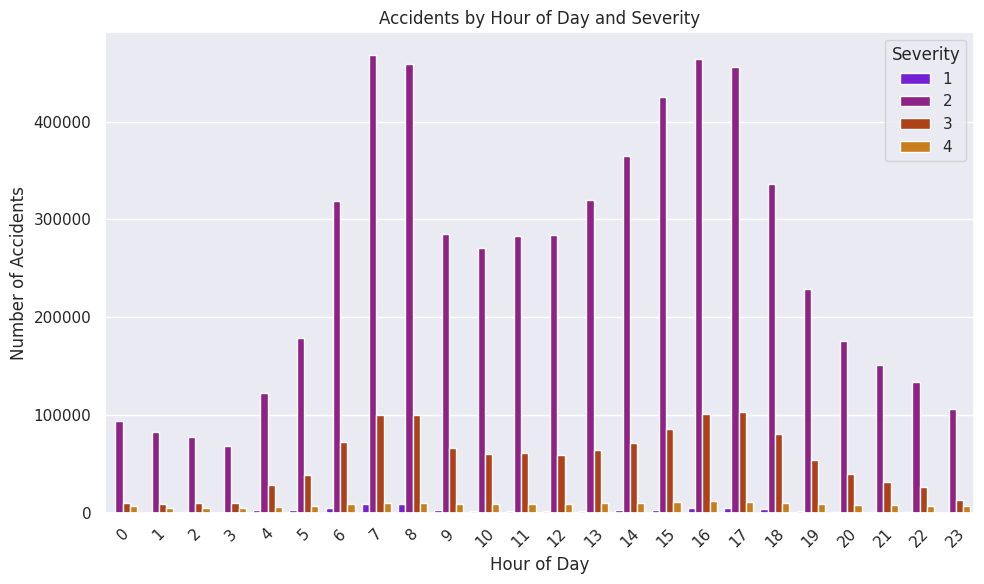

In [ ]:
# Set chart style
palette=sns.color_palette('gnuplot')
sns.set(style="darkgrid", palette="gnuplot", context="notebook",)

# Extract hour of day from 'Start_Time'
accidents['Hour_of_Day'] = accidents['Start_Time'].dt.hour

# Create a new dataset with 'Severity' and 'Hour_of_Day' columns
severity_hour_dataset = accidents[['Severity', 'Hour_of_Day']].copy()

# Task 3: Create a Seaborn countplot to visualize accidents by hour and severity
plt.figure(figsize=(10, 6))
sns.countplot(data=severity_hour_dataset, x='Hour_of_Day', hue='Severity', palette='gnuplot')
plt.title('Accidents by Hour of Day and Severity')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Accidents')
plt.legend(title='Severity')
plt.xticks(rotation=45)
plt.tight_layout()

plt.show()

* The accidents are clearly affected by the time of day. As expected, most accidents occur during commute from home to work or from work to home.

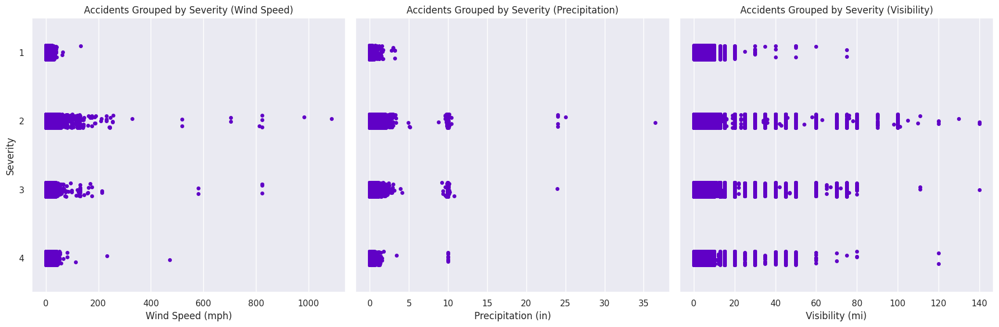

In [ ]:
# Change Severity to Category for this chart
accidents['Severity'] = accidents['Severity'].astype('category')

# Create a unified set of axes and a figure
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(18, 6), sharey=True)

# Scatterplot for Wind Speed
sns.stripplot(data=accidents, x='Wind_Speed(mph)', y='Severity', ax=axes[0])
axes[0].set_title('Accidents Grouped by Severity (Wind Speed)')
axes[0].set_xlabel('Wind Speed (mph)')
axes[0].set_ylabel('Severity')

# Scatterplot for Precipitation
sns.stripplot(data=accidents, x='Precipitation(in)', y='Severity', ax=axes[1])
axes[1].set_title('Accidents Grouped by Severity (Precipitation)')
axes[1].set_xlabel('Precipitation (in)')
axes[1].set_ylabel('Severity')

# Scatterplot for Visibility
sns.stripplot(data=accidents, x='Visibility(mi)', y='Severity', ax=axes[2])
axes[2].set_title('Accidents Grouped by Severity (Visibility)')
axes[2].set_xlabel('Visibility (mi)')
axes[2].set_ylabel('Severity')

# Adjust layout
plt.tight_layout()
plt.show()

accidents['Severity'] = accidents['Severity'].astype('int')

Although there are outliers, the main insight here is that the severity of accidents shows, more often than not, a very low correlation with these driving conditions.

## Correlation Chart

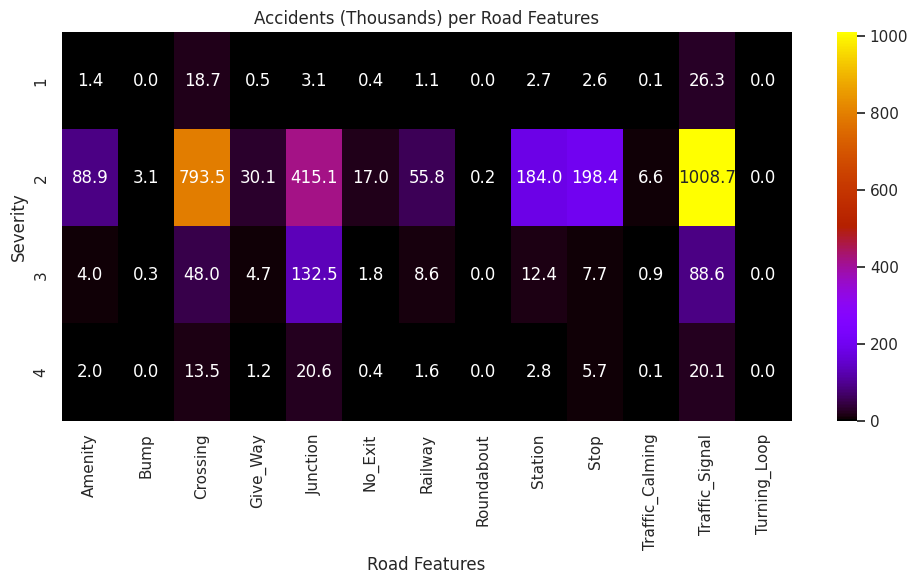

In [ ]:
# Create a new dataset with boolean columns and severity
bool_severity_dataset = accidents[['Severity', 'Amenity', 'Bump', 'Crossing', 'Give_Way', 'Junction',
                              'No_Exit', 'Railway', 'Roundabout', 'Station', 'Stop',
                              'Traffic_Calming', 'Traffic_Signal', 'Turning_Loop']].copy()

# Calculate the number of accidents for each combination of severity and boolean columns
accidents_by_bool_severity = bool_severity_dataset.groupby(['Severity']).sum()

# Create a heatmap to visualize the relationship between accident severity and boolean columns
plt.figure(figsize=(10, 6))
sns.heatmap(data=accidents_by_bool_severity/1000, cmap='gnuplot', annot=True, fmt='.1f')
plt.title('Accidents (Thousands) per Road Features')
plt.xlabel('Road Features')
plt.ylabel('Severity')
plt.tight_layout()

plt.show()

From the correlation chart we infer that:

- Junctions, crossings and traffic signals tend to have most car accidents.
- Junctions and traffic signals tend to have the most severe accidents.
- Roundabouts and Turning Loops have the least accidents.

## Folium Map Visualization

* We should note that this heatmap isn't scaled to account for traffic levels in these areas, which means it does not show the rate of accidents relative to traffic, but simply the absolute number of accidents.
* Also worth noting that the data is limited to a few states, as seen in the map below.D

In [ ]:
import folium
from folium.plugins import HeatMap

# Create a folium map centered at a specific location
m = folium.Map(location=[accident_coords['Start_Lat'].mean(), accident_coords['Start_Lng'].mean()], zoom_start=4.4)

# Convert your data to a list of coordinates
data = accident_coords[['Start_Lat', 'Start_Lng']].values.tolist()

# Create a HeatMap layer and add it to the folium map
HeatMap(data).add_to(m)

# Display the folium map
m